In [1]:
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM,SimpleRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from tensorflow.keras import losses
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects
from tensorflow.keras.models import load_model


In [2]:

period_size = 150
step_size = 50
median_q_threshold=0.5
lower_q_threshold=0.1
upper_q_threshold=0.9
anomaly_res =[40,-8]


1


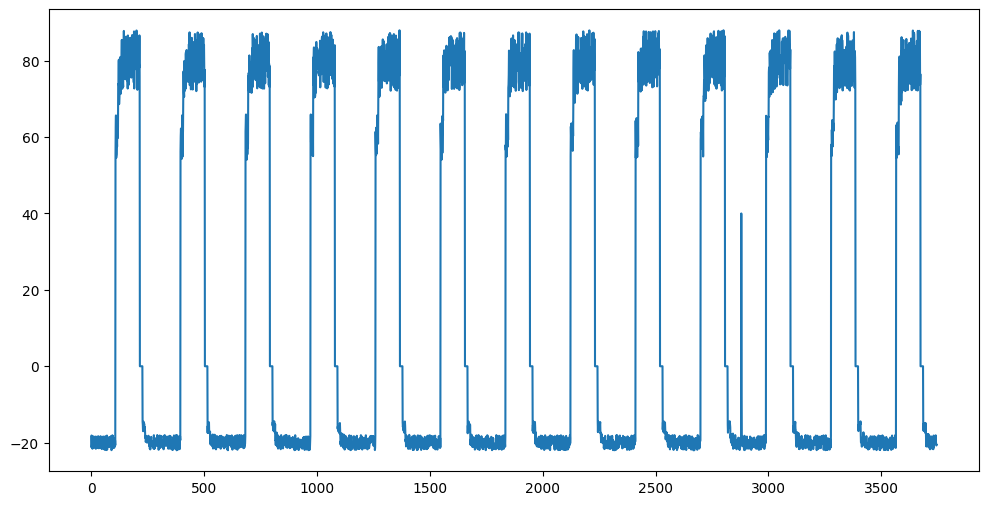

In [32]:
dataframe = read_csv('D:/Q-TV-RNN-Architecture/Q-TV-RNN/archive/artificialWithAnomaly/artificialWithAnomaly/art_daily_flatmiddle.csv',  engine='python')
dataframe = dataframe.sort_values(by='timestamp')
dataframe["value"]
plt.figure(figsize=(12, 6))
dataframepos = dataframe[dataframe['value']>35].reset_index(drop=True)
dataframepos = dataframepos.drop_duplicates(subset=['value']).reset_index(drop=True)

dataframe = dataframe.drop_duplicates(subset=['value']).reset_index(drop=True)
print(len(dataframe[dataframe['value'] == 40].reset_index(drop=True)))
plt.plot(dataframe['value'])

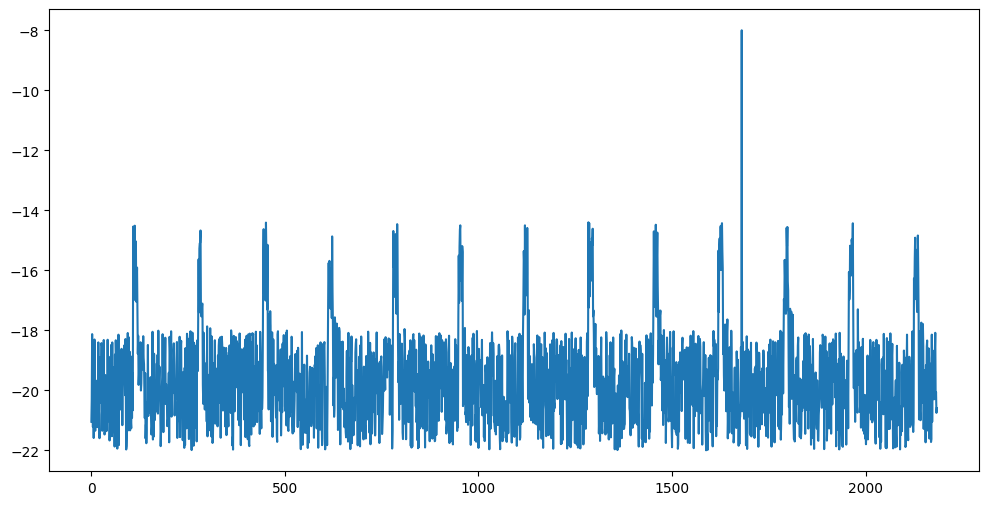

In [4]:
plt.figure(figsize=(12, 6))
dataframeneg = dataframe[dataframe['value']<-5].reset_index(drop=True)

dataframeneg = dataframeneg.drop_duplicates(subset=['value']).reset_index(drop=True)

plt.plot(dataframeneg['value'])

In [5]:
print(dataframepos[dataframepos['value'] < 41])

dataframepos2 = dataframepos
dataframepos2['label'] = 0
print()
dataframepos2.loc[1080,'label'] = 1
print()
print(dataframepos2.iloc[1080])

                timestamp  value
1080  2014-04-11 00:00:00   40.0


timestamp    2014-04-11 00:00:00
value                       40.0
label                          1
Name: 1080, dtype: object


In [6]:
print(dataframeneg[dataframeneg['value'] > -10])

dataframeneg2 = dataframeneg
dataframeneg2['label'] = 0
print()
dataframeneg2.loc[1680,'label'] = 1
print()
print(dataframeneg2.iloc[1680])

                timestamp  value
1680  2014-04-11 23:00:00   -8.0


timestamp    2014-04-11 23:00:00
value                       -8.0
label                          1
Name: 1680, dtype: object


In [7]:
dataframe2 = dataframe
dataframe2['label'] = 0
print()
dataframe2.loc[1080,'label'] = 1
dataframe2.loc[1680,'label'] = 1
print()

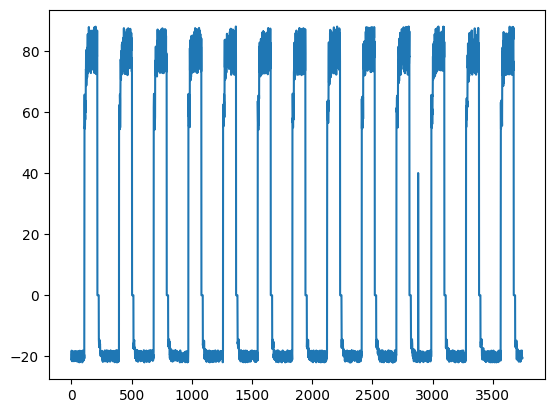

In [8]:
plt.plot(dataframe['value'])


In [9]:


# class Swish(Layer):
#     def __init__(self, beta, **kwargs):
#         super(Swish, self).__init__(**kwargs)
#         self.beta = K.cast_to_floatx(beta)
#         print('beta',self.beta)

#     def call(self, inputs):
#         print('beta', self.beta,'input',inputs)
#         return K.softsign(inputs) * self.beta

#     def get_config(self):
#         config = {'beta': float(self.beta)}
#         base_config = super(Swish, self).get_config()
#         return dict(list(base_config.items()) + list(config.items()))

#     def compute_output_shape(self, input_shape):
#         return input_shape


# def intersection(lst1, lst2):
#     lst3=[]
#     for itr in range(len(lst1)):
#         if lst1[itr][0] in lst2:
#             lst3.append(lst1[itr])
#     return lst3



# def verify_stationarity(dataset):
#     is_stationary=True
#     test_results = adfuller(dataset)

#     print(f"ADF test statistic: {test_results[0]}")
#     print(f"p-value: {test_results[1]}")
#     print("Critical thresholds:")

#     for key, value in test_results[4].items():
#         print(f"\t{key}: {value}")
#     itr = 0
#     for key, value in test_results[4].items():
#        print('\t%s: %.3f' % (key, value))
#        if itr==0:
#          critical=value
#        itr=itr+1

#     print('critical',critical)
#     if test_results[0] > critical:
#          print('non stationary')
#          is_stationary=False
#     return  is_stationary

# def create_dataset(dataset, look_back=1, tw=3):
#     dataX, dataY = [], []  # dtaset for mean
#     dataUpperX, dataUpperY = [], []  # dataset for std
#     dataLowerX, dataLowerY = [], []  # dataset for mean and std for third deep learning
#     multi = look_back // tw
#     for i in range(len(dataset) - look_back - 1):
#         q50X = []
#         q90X =  []
#         q10X = []
#         a = dataset[i + 1:(i + look_back + 1)]
#         indices = i + (multi - 1) * tw
#         # print('last window', dataset[indices:(i + look_back), 0])
#         c = numpy.quantile(a, median_q_threshold)
#         u = numpy.quantile(a, upper_q_threshold)
#         l = numpy.quantile(a, lower_q_threshold)
#         for j in range(0, len(a), tw):
#             q50 = numpy.quantile(a[j:j + tw], median_q_threshold)
#             q90 = numpy.quantile(a[j:j + tw], upper_q_threshold)
#             q10 = numpy.quantile(a[j:j + tw], lower_q_threshold)
#             q50X.append(q50)
#             q90X.append(q90)
#             q10X.append(q10)
#         dataX.append(q50X)
#         dataY.append(c)
#         dataUpperX.append(q90X)
#         dataUpperY.append(u)
#         dataLowerX.append(q10X)
#         dataLowerY.append(l)

    
#     return numpy.array(dataX), numpy.array(dataY), numpy.array(dataUpperX), numpy.array(dataUpperY), numpy.array(dataLowerX), numpy.array(dataLowerY)

# def identify_anomaly_quantiles(prediction_errors):
#     anomaly_detection=[]
#     for m in range(0, len(prediction_errors), period_size):
#         period_prediction_errors=prediction_errors[m:m + period_size]
#         upper_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.9)
#         lower_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.1)
#         #upper_threshold=avg+2*std1
#         #lower_threshold = avg - 2 * std1
#         for i in range(len(period_prediction_errors)):
#             if (period_prediction_errors[i]>0 and period_prediction_errors[i]> upper_threshold) or (period_prediction_errors[i]<0 and period_prediction_errors[i]< lower_threshold):
#                 anomaly_detection.append(period_prediction_errors[i])

#     return anomaly_detection

# def identify_anomaly(prediction_errors):
#     anomaly_detection=[]
#     for m in range(0, len(prediction_errors), period_size):
#         period_prediction_errors=prediction_errors[m:m + period_size]
#         avg = numpy.average(prediction_errors[m:m + period_size])
#         std1 = numpy.std(prediction_errors[m:m + period_size])
#         upper_threshold=avg+2*std1
#         lower_threshold = avg - 2 * std1
#         for i in range(len(period_prediction_errors)):
#             if (period_prediction_errors[i]> upper_threshold) or ( period_prediction_errors[i]< lower_threshold):
#                 anomaly_detection.append(period_prediction_errors[i])


#     return  anomaly_detection

# def identify_alpha(dataset):
#     alpha_detection=[]
#     alpha=1
#     prev_slope=1
#     for m in range(0, len(dataset), period_size):
#         period_dataset=dataset[m:m + period_size]
#         slope=period_dataset[len(period_dataset)-1]-period_dataset[0]
#         slope=slope/period_size
#         alpha=slope/prev_slope
#         alpha_detection.append(alpha)
#         prev_slope=slope

#     return  numpy.absolute(numpy.mean(alpha_detection))

In [10]:
# # fix random seed for reproducibility
# numpy.random.seed(7)
# # load the dataset
# dataframe = dataframe['value']
# dataset = dataframe.values
# dataset = dataset.reshape(-1, 1)

# stationary=verify_stationarity(dataset)
# #dataframe=dataframe.diff(axis = 0, periods = 1)
# #dataset = dataframe.dropna().values
# dataset = dataset.astype('float32')
# # normalize the dataset
# print('dataset', dataset)
# #dataset=dataset.dropna()
# stationary = verify_stationarity(dataset)
# scaler = MinMaxScaler(feature_range=(0, 1))

# dataset = scaler.fit_transform(dataset)

# # split into train and test sets
# train_size = int(len(dataset) * 0.7)
# test_size = len(dataset) - train_size
# train, test = dataset[0:train_size, :], dataset[train_size:len(dataset), :]
# std=numpy.std(train)
# # reshape into X=t and Y=t+1
# look_back = period_size
# tw = step_size
# multi = look_back // tw
# trainX, trainY, trainXU, trainYU, trainXL, trainYL = create_dataset(train, look_back, tw)
# testX, testY , testXU, testYU, testXL, testYL= create_dataset(test, look_back, tw)
# print(trainX)
# plt.figure(figsize=(12, 6))
# # plt.plot(ts, label="passengers")
# plt.plot(train, label="dataset")
# # plt.plot(anomalies_array, label="difference")
# # plt.plot(newdata['ewa'], label="ewa")
# plt.legend(loc='best')

# #plt.show()
# alpha=identify_alpha(dataset)
# print('alpha',alpha)
# # reshape input to be [samples, time steps, features]
# trainX = numpy.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
# testX = numpy.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# trainXU = numpy.reshape(trainXU, (trainXU.shape[0], trainXU.shape[1], 1))
# testXU = numpy.reshape(testXU, (testXU.shape[0], testXU.shape[1], 1))

# trainXL = numpy.reshape(trainXL, (trainXL.shape[0], trainXL.shape[1], 1))
# testXL = numpy.reshape(testXL, (testXL.shape[0], testXL.shape[1], 1))
# print(trainX)

# len(dataset)

# print("Splitting datasets into 3 parts for ensemble training...")

# # Split q50 (median) data
# trainX_parts = numpy.array_split(trainX, 3)
# trainY_parts = numpy.array_split(trainY, 3)

# # Split q10 (lower) data
# trainXL_parts = numpy.array_split(trainXL, 3)
# trainYL_parts = numpy.array_split(trainYL, 3)

# # Split q90 (upper) data
# trainXU_parts = numpy.array_split(trainXU, 3)
# trainYU_parts = numpy.array_split(trainYU, 3)


# print("Splitting test datasets into 3 parts for ensemble testing...")

# # Split q50 (median) data
# testX_parts = numpy.array_split(testX, 3)
# testY_parts = numpy.array_split(testY, 3)

# # Split q10 (lower) data
# testXL_parts = numpy.array_split(testXL, 3)
# testYL_parts = numpy.array_split(testYL, 3)

# # Split q90 (upper) data
# testXU_parts = numpy.array_split(testXU, 3)
# testYU_parts = numpy.array_split(testYU, 3)

# modelq50_1 = Sequential()
# modelq50_1.add(SimpleRNN(4, input_shape=(multi, 1)) )
# modelq50_1.add(Dense(1))
# modelq50_1.add(Swish(beta=1.5))
# modelq50_1.add(Activation(Swish(beta=1.5)))
# modelq50_1.compile(loss=losses.logcosh, optimizer='adam')
# modelq50_1.fit(trainX_parts[0], trainY_parts[0], epochs=50, batch_size=1, verbose=2)

# modelq10_1 = Sequential()
# modelq10_1.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq10_1.add(Dense(1))
# modelq10_1.add(Swish(beta=1.5))
# modelq10_1.add(Activation(Swish(beta=1.5)))
# modelq10_1.compile(loss=losses.logcosh, optimizer='adam')
# modelq10_1.fit(trainXL_parts[0], trainYL_parts[0], epochs=50, batch_size=1, verbose=2)

# modelq90_1 = Sequential()
# modelq90_1.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq90_1.add(Dense(1))
# modelq90_1.add(Swish(beta=1.5))
# modelq90_1.add(Activation(Swish(beta=1.5)))
# modelq90_1.compile(loss=losses.logcosh, optimizer='adam')
# modelq90_1.fit(trainXU_parts[0], trainYU_parts[0], epochs=50, batch_size=1, verbose=2)
# modelq10_1.save_weights("modelq10_1.weights.h5")
# modelq50_1.save_weights("modelq50_1.weights.h5")
# modelq90_1.save_weights("modelq90_1.weights.h5")

# modelq50_2 = Sequential()
# modelq50_2.add(SimpleRNN(4, input_shape=(multi, 1)) )
# modelq50_2.add(Dense(1))
# modelq50_2.add(Swish(beta=1.5))
# modelq50_2.add(Activation(Swish(beta=1.5)))
# modelq50_2.compile(loss=losses.logcosh, optimizer='adam')
# modelq50_2.fit(trainX_parts[1], trainY_parts[1], epochs=50, batch_size=1, verbose=2)

# modelq10_2 = Sequential()
# modelq10_2.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq10_2.add(Dense(1))
# modelq10_2.add(Swish(beta=1.5))
# modelq10_2.add(Activation(Swish(beta=1.5)))
# modelq10_2.compile(loss=losses.logcosh, optimizer='adam')
# modelq10_2.fit(trainXL_parts[1], trainYL_parts[1], epochs=50, batch_size=1, verbose=2)

# modelq90_2 = Sequential()
# modelq90_2.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq90_2.add(Dense(1))
# modelq90_2.add(Swish(beta=1.5))
# modelq90_2.add(Activation(Swish(beta=1.5)))
# modelq90_2.compile(loss=losses.logcosh, optimizer='adam')
# modelq90_2.fit(trainXU_parts[1], trainYU_parts[1], epochs=50, batch_size=1, verbose=2)
# modelq10_2.save_weights("modelq10_2.weights.h5")
# modelq50_2.save_weights("modelq50_2.weights.h5")
# modelq90_2.save_weights("modelq90_2.weights.h5")

# modelq50_3 = Sequential()
# modelq50_3.add(SimpleRNN(4, input_shape=(multi, 1)) )
# modelq50_3.add(Dense(1))
# modelq50_3.add(Swish(beta=1.5))
# modelq50_3.add(Activation(Swish(beta=1.5)))
# modelq50_3.compile(loss=losses.logcosh, optimizer='adam')
# modelq50_3.fit(trainX_parts[2], trainY_parts[2], epochs=50, batch_size=1, verbose=2)

# modelq10_3 = Sequential()
# modelq10_3.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq10_3.add(Dense(1))
# modelq10_3.add(Swish(beta=1.5))
# modelq10_3.add(Activation(Swish(beta=1.5)))
# modelq10_3.compile(loss=losses.logcosh, optimizer='adam')
# modelq10_3.fit(trainXL_parts[2], trainYL_parts[2], epochs=50, batch_size=1, verbose=2)

# modelq90_3 = Sequential()
# modelq90_3.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq90_3.add(Dense(1))
# modelq90_3.add(Swish(beta=1.5))
# modelq90_3.add(Activation(Swish(beta=1.5)))
# modelq90_3.compile(loss=losses.logcosh, optimizer='adam')
# modelq90_3.fit(trainXU_parts[2], trainYU_parts[2], epochs=50, batch_size=1, verbose=2)
# modelq10_3.save_weights("modelq10_3.weights.h5")
# modelq50_3.save_weights("modelq50_3.weights.h5")
# modelq90_3.save_weights("modelq90_3.weights.h5")

In [11]:
# i = 0
# j = look_back
# actual_quantile_interval = []
# steps = tw
# positive = True
# anomalies=[]
# finalres_q10 = []
# finalres_q90 = []
# dataframe = dataframe2['value']
# dataset = dataframe.values
# dataset = dataset.reshape(-1,1)
# dataset = scaler.fit_transform(dataset)
# ar = [40,-8]
# # ar.append(dataset[1271][0])
# # ar.append(dataset[2970][0])



# ts = dataset
# ts_accumulate=[]
# comparison_dataset=[]
# p_q10 = []
# p_q50 = []
# p_q90 = []

# ar

In [12]:
# dataframe2 = dataframe2
# dataframe2[dataframe2 == 1].dropna()


In [13]:

# while j <= len(dataset)-2:
#     q50_array = []
#     q10_array = []
#     q90_array = []

#     temp = dataset[i:j]
#     actual_quantile_interval.append(
#         numpy.absolute(numpy.quantile(dataset[i + 1:j + 1], lower_q_threshold) - numpy.quantile(dataset[i + 1:j + 1], median_q_threshold)))
#     #print('print here', temp)

#     for m in range(0, len(temp), steps):
#         q50array = []
#         q10array = []
#         q90array = []
#         q50 = numpy.quantile(temp[m:m + steps], median_q_threshold)
#         q50array.append(q50)
#         q50_array.append(q50array)

#         q90 = numpy.quantile(temp[m:m + steps], upper_q_threshold)
#         q90array.append(q90)
#         q90_array.append(q90array)

#         q10 = numpy.quantile(temp[m:m + steps], lower_q_threshold)
#         q10array.append(q10)
#         q10_array.append(q10array)

#     final_q50_array = []
#     final_q50_array.append(q50_array)
#     #print('final_q10_array', final_q50_array)
#     final_q10_array = []
#     final_q10_array.append(q10_array)

#     final_q90_array = []
#     final_q90_array.append(q90_array)

    
#     p_q10.append(final_q10_array)
#     p_q50.append(final_q50_array)
#     p_q90.append(final_q90_array)

#     j = j + 1
#     i = i + 1

# leftover_len = len(dataset)-152
# one_third_part = leftover_len//3    
# print(one_third_part)
# j = 150
# one_third_part_idx = j+one_third_part
# i = 0
# while j <= len(dataset)-2:
#     if(one_third_part_idx < j):
#         #first    
#         q50_predict = modelq50_1.predict(numpy.array(p_q50[i]).reshape(1,3,1))
#         print('q50_predict', q50_predict)
#         q10_predict = modelq10_1.predict(numpy.array(p_q10[i]).reshape(1,3,1))
#         q90_predict = modelq90_1.predict(numpy.array(p_q90[i]).reshape(1,3,1))

#     elif((one_third_part_idx>j)&((one_third_part_idx+one_third_part)<j)):
#         #second
#         q50_predict = modelq50_2.predict(numpy.array(p_q50[i]).reshape(1,3,1))
#         print('q50_predict', q50_predict)
#         q10_predict = modelq10_2.predict(numpy.array(p_q10[i]).reshape(1,3,1))
#         q90_predict = modelq90_2.predict(numpy.array(p_q90[i]).reshape(1,3,1))

#     else:
#         #third
#         q50_predict = modelq50_3.predict(numpy.array(p_q50[i]).reshape(1,3,1))
#         print('q50_predict', q50_predict)
#         q10_predict = modelq10_3.predict(numpy.array(p_q10[i]).reshape(1,3,1))
#         q90_predict = modelq90_3.predict(numpy.array(p_q90[i]).reshape(1,3,1))



#     if j+1 < len(dataset) :
#         iqr=q90_predict-q10_predict
#         ucl=q50_predict+.95*iqr
#         lcl=q50_predict-.95*iqr
#         diff=q50_predict-dataset[j+1]
#         if dataset[j+1]>ucl or dataset[j+1]<lcl:
#             anomalies.append(dataset[j+1])
#     j+=1
#     i+=1


# '''prediction_array_q10 = []
# prediction_array_q90 = []'''
# anomalies_array=[]

# for h in range(len(anomalies)):
#     internal = anomalies[h]
#     internal_array = []
#     anomalies_array.append(internal)
# anomalies_array = scaler.inverse_transform(anomalies_array)
# print('anomaly_iden', anomalies_array)
# print('anomaly_iden size', len(anomalies_array))
# plt.figure(figsize=(12, 6))
# #plt.plot(ts, label="passengers")
# plt.plot(dataset, label="dataset")
# #plt.plot(anomalies_array, label="difference")
# #plt.plot(newdata['ewa'], label="ewa")
# plt.legend(loc='best')

# plt.show()

# anomaly_res = ar
# anomalies = numpy.unique(anomalies_array)
# print('anomaly_iden', anomalies)
# print('anomaly_iden size', len(anomalies))
# print('ani', anomaly_res)

# anomalies_to_int = []

# for i in anomalies:
#     anomalies_to_int.append(int(i))


# truep = (numpy.intersect1d(numpy.array(anomalies_to_int), numpy.array(anomaly_res)))
# print("TP:")
# tp = len(truep)
# print(tp)
# print("FP:")
# fp = (len(anomalies) - len(truep))
# print(fp)
# print("FN:")
# fn = len(anomaly_res) - len(truep)
# print(fn)
# # print("TN:")
# # print(1670-tp-fp-fn)
# #1670 - datapoints in yahoo8
# precision = tp/(tp+fp)
# recall = tp/(tp+fn)
# print("Precision:")
# print(precision)
# print("Recall:")
# print(recall)

In [14]:

# anomaly_res = [62,68]
# anomalies = numpy.unique(anomalies_array)
# print('anomaly_iden', anomalies)
# print('anomaly_iden size', len(anomalies))
# print('ani', anomaly_res)

# anomalies_to_int = []

# for i in anomalies:
#     anomalies_to_int.append(int(i))


# truep = (numpy.intersect1d(numpy.array(anomalies_to_int), numpy.array(anomaly_res)))
# print("TP:")
# tp = len(truep)
# print(tp)
# print("FP:")
# fp = (len(anomalies) - len(truep))
# print(fp)
# print("FN:")
# fn = len(anomaly_res) - len(truep)
# print(fn)
# # print("TN:")
# # print(1670-tp-fp-fn)
# #1670 - datapoints in yahoo8
# precision = tp/(tp+fp)
# recall = tp/(tp+fn)
# print("Precision:")
# print(precision)
# print("Recall:")
# print(recall)

# -----------------------------------

In [15]:
# print(anomalies)
# x = []

# for i in anomalies:
#     x.append(int(i))

# print(x)
# anomaly_res = [15.,11.]
# print(anomaly_res)

# truep = (numpy.intersect1d(numpy.array(x), numpy.array(anomaly_res)))
# print(truep)
# print(type(anomalies))

In [16]:
# x = [15,11]
# y = [15.,11.]
# x = numpy.array(x)
# y = numpy.array(y)
# truep = (numpy.intersect1d((x), numpy.array(y)))
# print(truep)

In [17]:
# accuracy = (tp + (1670 - tp - fp - fn)) / 1670
# print("Accuracy:")
# print(accuracy)


# ----------------------------
## ----------------------------

In [39]:
dataframe = read_csv('D:/Q-TV-RNN-Architecture/Q-TV-RNN/archive/artificialWithAnomaly/artificialWithAnomaly/art_daily_flatmiddle.csv',  engine='python')
dataframe = dataframe.sort_values(by='timestamp')
dataframe["value"]
dataframe = dataframe.drop_duplicates(subset=['value']).reset_index(drop=True)
print(dataframe[dataframe['value']==-8])
print(dataframe[dataframe['value']==40])
dataframe2 = dataframe
dataframe2['label'] = 0
print()
print(dataframe2[dataframe['value']==-8])
print(dataframe2[dataframe['value']==40])
dataframe2.loc[2880,'label'] = 1
dataframe2.loc[2881,'label'] = 1
print(dataframe2[dataframe['value']==-8])
print(dataframe2[dataframe['value']==40])
print()

                timestamp  value
2881  2014-04-11 23:00:00   -8.0
                timestamp  value
2880  2014-04-11 00:00:00   40.0

                timestamp  value  label
2881  2014-04-11 23:00:00   -8.0      0
                timestamp  value  label
2880  2014-04-11 00:00:00   40.0      0
                timestamp  value  label
2881  2014-04-11 23:00:00   -8.0      1
                timestamp  value  label
2880  2014-04-11 00:00:00   40.0      1



In [ ]:
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from tensorflow.keras import losses
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects

period_size = 150
step_size = 50
median_q_threshold=0.5
lower_q_threshold=0.1
upper_q_threshold=0.9
anomaly_res =[40,-8]


class Swish(Layer):
    def __init__(self, beta, **kwargs):
        super(Swish, self).__init__(**kwargs)
        self.beta = K.cast_to_floatx(beta)
        print('beta',self.beta)

    def call(self, inputs):
        print('beta', self.beta,'input',inputs)
        return K.softsign(inputs) * self.beta

    def get_config(self):
        config = {'beta': float(self.beta)}
        base_config = super(Swish, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def compute_output_shape(self, input_shape):
        return input_shape


def intersection(lst1, lst2):
    lst3=[]
    for itr in range(len(lst1)):
        if lst1[itr][0] in lst2:
            lst3.append(lst1[itr])
    return lst3



def verify_stationarity(dataset):
    is_stationary=True
    test_results = adfuller(dataset)

    print(f"ADF test statistic: {test_results[0]}")
    print(f"p-value: {test_results[1]}")
    print("Critical thresholds:")

    for key, value in test_results[4].items():
        print(f"\t{key}: {value}")
    itr = 0
    for key, value in test_results[4].items():
       print('\t%s: %.3f' % (key, value))
       if itr==0:
         critical=value
       itr=itr+1

    print('critical',critical)
    if test_results[0] > critical:
         print('non stationary')
         is_stationary=False
    return  is_stationary

def create_dataset(dataset, look_back=1, tw=3):
    dataX, dataY = [], []  # dtaset for mean
    dataUpperX, dataUpperY = [], []  # dataset for std
    dataLowerX, dataLowerY = [], []  # dataset for mean and std for third deep learning
    multi = look_back // tw
    for i in range(len(dataset) - look_back - 1):
        q50X = []
        q90X =  []
        q10X = []
        a = dataset[i + 1:(i + look_back + 1)]
        indices = i + (multi - 1) * tw
        # print('last window', dataset[indices:(i + look_back), 0])
        c = numpy.quantile(a, median_q_threshold)
        u = numpy.quantile(a, upper_q_threshold)
        l = numpy.quantile(a, lower_q_threshold)
        for j in range(0, len(a), tw):
            q50 = numpy.quantile(a[j:j + tw], median_q_threshold)
            q90 = numpy.quantile(a[j:j + tw], upper_q_threshold)
            q10 = numpy.quantile(a[j:j + tw], lower_q_threshold)
            q50X.append(q50)
            q90X.append(q90)
            q10X.append(q10)
        dataX.append(q50X)
        dataY.append(c)
        dataUpperX.append(q90X)
        dataUpperY.append(u)
        dataLowerX.append(q10X)
        dataLowerY.append(l)

    return numpy.array(dataX), numpy.array(dataY), numpy.array(dataUpperX), numpy.array(dataUpperY), numpy.array(dataLowerX), numpy.array(dataLowerY)
def identify_anomaly_quantiles(prediction_errors):
    anomaly_detection=[]
    for m in range(0, len(prediction_errors), period_size):
        period_prediction_errors=prediction_errors[m:m + period_size]
        upper_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.9)
        lower_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.1)
        #upper_threshold=avg+2*std1
        #lower_threshold = avg - 2 * std1
        for i in range(len(period_prediction_errors)):
            if (period_prediction_errors[i]>0 and period_prediction_errors[i]> upper_threshold) or (period_prediction_errors[i]<0 and period_prediction_errors[i]< lower_threshold):
                anomaly_detection.append(period_prediction_errors[i])

    return anomaly_detection

def identify_anomaly(prediction_errors):
    anomaly_detection=[]
    for m in range(0, len(prediction_errors), period_size):
        period_prediction_errors=prediction_errors[m:m + period_size]
        avg = numpy.average(prediction_errors[m:m + period_size])
        std1 = numpy.std(prediction_errors[m:m + period_size])
        upper_threshold=avg+2*std1
        lower_threshold = avg - 2 * std1
        for i in range(len(period_prediction_errors)):
            if (period_prediction_errors[i]> upper_threshold) or ( period_prediction_errors[i]< lower_threshold):
                anomaly_detection.append(period_prediction_errors[i])


    return  anomaly_detection

def identify_alpha(dataset):
    alpha_detection=[]
    alpha=1
    prev_slope=1
    for m in range(0, len(dataset), period_size):
        period_dataset=dataset[m:m + period_size]
        slope=period_dataset[len(period_dataset)-1]-period_dataset[0]
        slope=slope/period_size
        alpha=slope/prev_slope
        alpha_detection.append(alpha)
        prev_slope=slope

    return  numpy.absolute(numpy.mean(alpha_detection))
if __name__ == '__main__':
    # fix random seed for reproducibility
    numpy.random.seed(7)
    # load the dataset
    dataframe = dataframe['value']
    dataset = dataframe.values
    dataset = dataset.reshape(-1,1)
    stationary=verify_stationarity(dataset)
    #dataframe=dataframe.diff(axis = 0, periods = 1)
    #dataset = dataframe.dropna().values
    dataset = dataset.astype('float32')
    # normalize the dataset
    print('dataset', dataset)
    #dataset=dataset.dropna()
    stationary = verify_stationarity(dataset)
    scaler = MinMaxScaler(feature_range=(0, 1))

    dataset = scaler.fit_transform(dataset)

    # split into train and test sets
    train_size = int(len(dataset) * 0.7)
    test_size = len(dataset) - train_size
    train, test = dataset[0:train_size, :], dataset[train_size:len(dataset), :]
    std=numpy.std(train)
    # reshape into X=t and Y=t+1
    look_back = period_size
    tw = step_size
    multi = look_back // tw
    trainX, trainY, trainXU, trainYU, trainXL, trainYL = create_dataset(train, look_back, tw)
    testX, testY , testXU, testYU, testXL, testYL= create_dataset(test, look_back, tw)
    print(trainX)

    #plt.show()
    alpha=identify_alpha(dataset)
    print('alpha',alpha)
    # reshape input to be [samples, time steps, features]
    trainX = numpy.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
    testX = numpy.reshape(testX, (testX.shape[0], testX.shape[1], 1))

    trainXU = numpy.reshape(trainXU, (trainXU.shape[0], trainXU.shape[1], 1))
    testXU = numpy.reshape(testXU, (testXU.shape[0], testXU.shape[1], 1))

    trainXL = numpy.reshape(trainXL, (trainXL.shape[0], trainXL.shape[1], 1))
    testXL = numpy.reshape(testXL, (testXL.shape[0], testXL.shape[1], 1))
    print(trainX)

    modelq50 = Sequential()
    modelq50.add(LSTM(4, input_shape=(multi, 1)) )
    modelq50.add(Dense(1))
    modelq50.add(Swish(beta=1.5))
    modelq50.add(Activation(Swish(beta=1.5)))
    modelq50.compile(loss=losses.logcosh, optimizer='adam')
    modelq50.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

    modelq10 = Sequential()
    modelq10.add(LSTM(4, input_shape=(multi, 1)))
    modelq10.add(Dense(1))
    modelq10.add(Swish(beta=1.5))
    modelq10.add(Activation(Swish(beta=1.5)))
    modelq10.compile(loss=losses.logcosh, optimizer='adam')
    modelq10.fit(trainXL, trainYL, epochs=50, batch_size=1, verbose=2)

    modelq90 = Sequential()
    modelq90.add(LSTM(4, input_shape=(multi, 1)))
    modelq90.add(Dense(1))
    modelq90.add(Swish(beta=1.5))
    modelq90.add(Activation(Swish(beta=1.5)))
    modelq90.compile(loss=losses.logcosh, optimizer='adam')
    modelq90.fit(trainXU, trainYU, epochs=50, batch_size=1, verbose=2)
    # trainmeanPredict = modelmean.predict(numpy.array(trainX)
    # t).reshape(1,3,1)estmeanPredict = modelmean.predict(numpy.array(testX)
    # tr).reshape(1,3,1)ainstdPredict = modelstd.predict(numpy.array(trainX)
    # t).reshape(1,3,1)eststdPredict = modelstd.predict(numpy.array(testX)
    # pr).reshape(1,3,1)int('trainmeanPredict',trainmeanPredict)
    i = 0
    j = look_back
    actual_quantile_interval = []
    steps = tw
    positive = True
    anomalies=[]
    finalres_q10 = []
    finalres_q90 = []
    dataframe = dataframe2['value']
    dataset = dataframe.values
    dataset = dataset.reshape(-1,1)
    dataset = scaler.fit_transform(dataset)
    ts = dataset
    ts_accumulate=[]
    comparison_dataset=[]
    while j <= len(dataset)-2:
        q50_array = []
        q10_array = []
        q90_array = []


        temp = dataset[i:j]
        actual_quantile_interval.append(
            numpy.absolute(numpy.quantile(dataset[i + 1:j + 1], lower_q_threshold) - numpy.quantile(dataset[i + 1:j + 1], median_q_threshold)))
        print('print here', temp)

        for m in range(0, len(temp), steps):
            q50array = []
            q10array = []
            q90array = []
            q50 = numpy.quantile(temp[m:m + steps], median_q_threshold)
            q50array.append(q50)
            q50_array.append(q50array)

            q90 = numpy.quantile(temp[m:m + steps], upper_q_threshold)
            q90array.append(q90)
            q90_array.append(q90array)

            q10 = numpy.quantile(temp[m:m + steps], lower_q_threshold)
            q10array.append(q10)
            q10_array.append(q10array)

        # print('stdarray1', std_array)
        # std_array = numpy.array(std_array)
        # print('stdarray2', std_array)
        # std_array = numpy.reshape(std_array, (std_array.shape[0],std_array.shape[1], 1))
        # print('stdarray3', std_array)
        # print('avg_array',avg_array)
        # avg_array = numpy.array(avg_array)
        # avg_array = numpy.reshape(avg_array, (avg_array.shape[0],1, 1))
        final_q50_array = []
        final_q50_array.append(q50_array)
        print('final_q10_array', final_q50_array)
        final_q10_array = []
        final_q10_array.append(q10_array)

        final_q90_array = []
        final_q90_array.append(q90_array)
        q50_predict = modelq50.predict(numpy.array(final_q50_array).reshape(1,3,1))
        print('q50_predict', q50_predict)
        q10_predict = modelq10.predict(numpy.array(final_q10_array).reshape(1,3,1))
        q90_predict = modelq90.predict(numpy.array(final_q90_array).reshape(1,3,1))

        if j+1 < len(dataset) :
            iqr=q90_predict-q10_predict
            ucl=q50_predict+.95*iqr
            lcl=q50_predict-.95*iqr
            diff=q50_predict-dataset[j+1]
            if dataset[j+1]>ucl or dataset[j+1]<lcl:
                anomalies.append(dataset[j+1])
            #print('data',dataset[j+1],'diff',diff)

            #comparison_dataset.append(dataset[j+1])
            #dataset=numpy.delete(dataset,j+1)
            #print('length',len(dataset))
        #finalres_q10.append(q10_predict)
        #finalres_q90.append(q90_predict)

        j = j + 1
        i = i + 1

    # print('finalres',finalres)
    '''prediction_array_q10 = []
    prediction_array_q90 = []'''
    anomalies_array=[]

    for h in range(len(anomalies)):
        internal = anomalies[h]
        internal_array = []
        #internal_array.append(internal[0])
        anomalies_array.append(internal)
    anomalies_array = scaler.inverse_transform(anomalies_array)
    #comparison_dataset=scaler.inverse_transform(comparison_dataset)
    #print(anomalies_array)
    print('anomaly_iden', anomalies_array)
    print('anomaly_iden size', len(anomalies_array))
    '''for itr in range(len(anomalies_array)):
        print('data',comparison_dataset[itr],'diff',anomalies_array[itr])
    print('anomaly length',len(anomalies_array))'''
    '''ts_accumulate_another=[]
    for h in range(len(finalres_q10)):
        internal = finalres_q10[h]
        internal_q90 = finalres_q90[h]
        prediction_array_q10.append(internal[0])
        prediction_array_q90.append(internal_q90[0])
    for g in range(len(ts_accumulate)):
        internal=[]
        internal.append(ts_accumulate[g])
        #internal_q90 = finalres_q90[h]
        ts_accumulate_another.append(internal)
    finalres_q10 = scaler.inverse_transform(prediction_array_q10)
    finalres_q90 = scaler.inverse_transform(prediction_array_q90)
    #print('finalres', finalres_q10)'''
    '''trunc_finalres = []
    for g in range(len(finalres)):
        trunc_finalres.append(finalres[g])'''
    '''ts = ts[look_back:]
    ts = scaler.inverse_transform(ts)
    ts_accumulate=scaler.inverse_transform(ts_accumulate_another)
    print('lenght', len(ts_accumulate), 'actual_quantile_interval', len(finalres_q10))'''
    '''ts_array = []
    for g in range(len(ts)):
        ts_array.append(ts[g])'''
    '''finalres_q10_array=[]
    finalres_q90_array=[]
    for g in range(len(finalres_q10)-1):
        finalres_q10_array.append(finalres_q10[g])
        finalres_q90_array.append(finalres_q90[g])
    prediction_errors = []'''
   # for y in range(len(finalres_q10_array)):
    #    print('ts_accumulate',ts_accumulate[y], 'finalres_q10_array', finalres_q10_array[y], 'finalres_q90_array', finalres_q90_array[y])
        #prediction_errors.append(numpy.absolute(actual_quantile_interval[y] - trunc_finalres[y]))
    # testScore = math.sqrt(mean_squared_error(ts, trunc_finalres))
    # print('Test Score: %.2f RMSE' % (testScore))
    '''anomalies = identify_anomaly(anomalies_array)
    print('anomaly_iden', anomalies)
    print('anomaly_iden size', len(anomalies))
    print(intersection(anomalies, anomaly_res))'''
    plt.figure(figsize=(12, 6))
    #plt.plot(ts, label="passengers")
    plt.plot(dataset, label="dataset")
    #plt.plot(anomalies_array, label="difference")
    #plt.plot(newdata['ewa'], label="ewa")
    plt.legend(loc='best')

    plt.show()


    anomaly_res = [40,-8]
    anomalies = numpy.unique(anomalies_array)
    print('anomaly_iden', anomalies)
    print('anomaly_iden size', len(anomalies))
    print('ani', anomaly_res)

    anomalies_to_int = []

    for i in anomalies:
        anomalies_to_int.append(int(i))

    truep = (numpy.intersect1d(numpy.array(anomalies_to_int), numpy.array(anomaly_res)))
    print("TP:")
    tp = len(truep)
    print(tp)
    print("FP:")
    fp = (len(anomalies) - len(truep))
    print(fp)
    print("FN:")
    fn = len(anomaly_res) - len(truep)
    print(fn)
    print("TN:")
    print(1670-tp-fp-fn)
    #1670 - datapoints in yahoo8
    precision = tp/(tp+fp)
    recall = tp/(tp+fn)
    print("Precision:")
    print(precision)
    print("Recall:")
    print(recall)

ADF test statistic: -5.594171977895059
p-value: 1.3084633604510013e-06
Critical thresholds:
	1%: -3.4321034307501512
	5%: -2.8623147688604362
	10%: -2.567182420332135
	1%: -3.432
	5%: -2.862
	10%: -2.567
critical -3.4321034307501512
dataset [[-21.048382]
 [-20.295477]
 [-18.12723 ]
 ...
 [-20.063238]
 [-20.751972]
 [-20.592697]]
ADF test statistic: -5.5941719618968575
p-value: 1.3084634642679973e-06
Critical thresholds:
	1%: -3.4321034307501512
	5%: -2.8623147688604362
	10%: -2.567182420332135
	1%: -3.432
	5%: -2.862
	10%: -2.567
critical -3.4321034307501512
[[0.01519682 0.01921697 0.8638013 ]
 [0.0156258  0.01817055 0.8679589 ]
 [0.01464477 0.01817055 0.8708422 ]
 ...
 [0.9397752  0.04221439 0.01879028]
 [0.9424281  0.04201255 0.01994693]
 [0.9397752  0.04149263 0.02134527]]
alpha 0.7519109
[[[0.01519682]
  [0.01921697]
  [0.8638013 ]]

 [[0.0156258 ]
  [0.01817055]
  [0.8679589 ]]

 [[0.01464477]
  [0.01817055]
  [0.8708422 ]]

 ...

 [[0.9397752 ]
  [0.04221439]
  [0.01879028]]

 [[

c:\Users\ASUS\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


beta 1.5
beta 1.5
Epoch 1/50
beta 1.5 input Tensor("sequential_9_1/dense_9_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_9_1/swish_18_1/mul:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_9_1/dense_9_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_9_1/swish_18_1/mul:0", shape=(1, 1), dtype=float32)
2471/2471 - 14s - 6ms/step - loss: 0.0483
Epoch 2/50
2471/2471 - 3s - 1ms/step - loss: 0.0112
Epoch 3/50
2471/2471 - 4s - 2ms/step - loss: 0.0036
Epoch 4/50
2471/2471 - 5s - 2ms/step - loss: 0.0029
Epoch 5/50
2471/2471 - 11s - 4ms/step - loss: 0.0025
Epoch 6/50
2471/2471 - 5s - 2ms/step - loss: 0.0022
Epoch 7/50
2471/2471 - 3s - 1ms/step - loss: 0.0019
Epoch 8/50
2471/2471 - 3s - 1ms/step - loss: 0.0017
Epoch 9/50
2471/2471 - 3s - 1ms/step - loss: 0.0015
Epoch 10/50
2471/2471 - 3s - 1ms/step - loss: 0.0013
Epoch 11/50
2471/2471 - 3s - 1ms/step - loss: 0.0011
Epoch 12/50
2471/2471 - 3s - 1ms/step - loss: 9.9784e-04
Epoch 1

ADF test statistic: -9.536681299295152
p-value: 2.79660501780767e-16
Critical thresholds:
	1%: -3.435053080535985
	5%: -2.8636170711540054
	10%: -2.5678758266411537
	1%: -3.435
	5%: -2.864
	10%: -2.568
critical -3.435053080535985
dataset [[55.46426 ]
 [62.467037]
 [65.66529 ]
 ...
 [87.537094]
 [73.690094]
 [76.4786  ]]
ADF test statistic: -9.536680990743122
p-value: 2.7966100616264727e-16
Critical thresholds:
	1%: -3.435053080535985
	5%: -2.8636170711540054
	10%: -2.5678758266411537
	1%: -3.435
	5%: -2.864
	10%: -2.568
critical -3.435053080535985
[[0.7356453  0.868865   0.76387495]
 [0.7409673  0.868865   0.7695931 ]
 [0.75271803 0.87309206 0.76387495]
 ...
 [0.780245   0.81863457 0.84644943]
 [0.7732758  0.8270279  0.8317681 ]
 [0.7664188  0.8313168  0.82254833]]
alpha 0.20574391
[[[0.7356453 ]
  [0.868865  ]
  [0.76387495]]

 [[0.7409673 ]
  [0.868865  ]
  [0.7695931 ]]

 [[0.75271803]
  [0.87309206]
  [0.76387495]]

 ...

 [[0.780245  ]
  [0.81863457]
  [0.84644943]]

 [[0.7732758 

c:\Users\ASUS\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



beta 1.5 input Tensor("Placeholder:0", shape=(None, 1), dtype=float32)
beta 1.5
beta 1.5 input Tensor("Placeholder:0", shape=(None, 1), dtype=float32)
Epoch 1/50
beta 1.5 input Tensor("sequential_3_1/dense_3_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_3_1/swish_6_1/mul:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_3_1/dense_3_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_3_1/swish_6_1/mul:0", shape=(1, 1), dtype=float32)
832/832 - 3s - 4ms/step - loss: 0.0155
Epoch 2/50
832/832 - 2s - 2ms/step - loss: 8.1473e-04
Epoch 3/50
832/832 - 2s - 2ms/step - loss: 1.7924e-04
Epoch 4/50
832/832 - 2s - 2ms/step - loss: 9.3903e-05
Epoch 5/50
832/832 - 2s - 2ms/step - loss: 8.3592e-05
Epoch 6/50
832/832 - 2s - 2ms/step - loss: 8.2501e-05
Epoch 7/50
832/832 - 2s - 2ms/step - loss: 8.1702e-05
Epoch 8/50
832/832 - 2s - 2ms/step - loss: 8.0626e-05
Epoch 9/50
832/832 - 2s - 2ms/step - loss: 7.9742e-05
Epoch 10/50
832/832 - 2s -

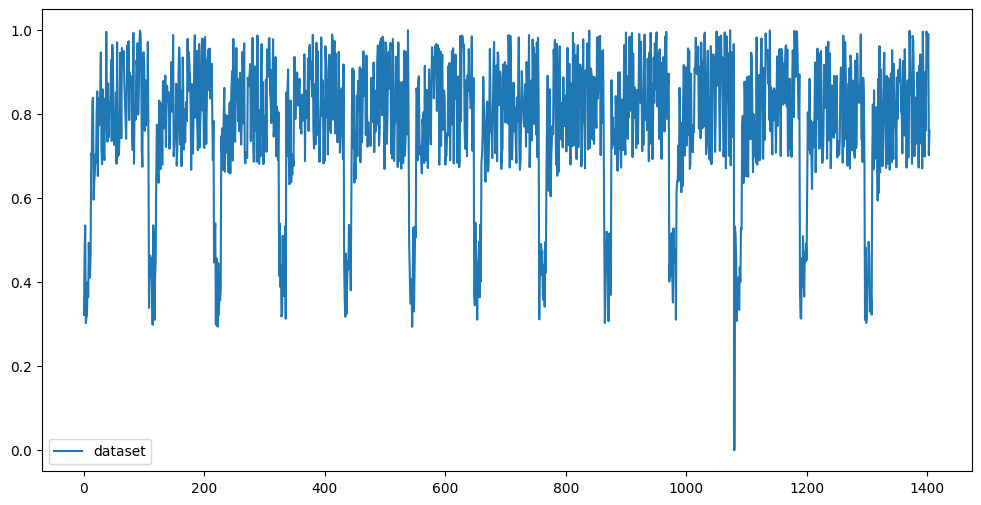

anomaly_iden [40.         54.10570809 54.11745466 54.35568087 54.5395981  54.54920944
 54.75423952 54.76450765 54.89282469 54.90783122 54.91178139 54.94694437
 55.01268595 55.02381389 55.1323189  55.25252315 55.26711679 55.27964116
 55.46912758 55.48407165 55.57926659 55.69416598 55.83984214 55.85648258
 56.02683449 56.40098568 56.57214672 56.7137614  56.72275608 56.80611907
 56.87697576 57.07092116 57.13640511 57.15930991 57.42810226 57.46292224
 57.54411865 57.60413554 57.66541528 57.68832698 57.73891521 57.89802309
 57.91450336 57.98613573 58.26714473 58.27125272 58.33396083 58.46067597
 58.5428022  58.62401762 58.64883265 58.86805743 58.97459464 59.26111935
 59.28570448 59.32488935 59.57909577 59.63620624 59.71376411 59.77055803
 59.91468683 59.91580809 59.97569506 59.98659667 60.19686165 60.37620906
 61.12657485 61.18404309 61.32452715 61.37233132 61.40203909 61.46100236
 61.57648896 61.58598198 61.68152503 61.79774438 61.90067471 61.92069807
 61.96733088 62.05178679 62.46719716 6

In [20]:
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import SimpleRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from tensorflow.keras import losses
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects

period_size = 150
step_size = 50
median_q_threshold=0.5
lower_q_threshold=0.1
upper_q_threshold=0.9
anomaly_res =[40,-8]


class Swish(Layer):
    def __init__(self, beta, **kwargs):
        super(Swish, self).__init__(**kwargs)
        self.beta = K.cast_to_floatx(beta)
        print('beta',self.beta)

    def call(self, inputs):
        print('beta', self.beta,'input',inputs)
        return K.softsign(inputs) * self.beta

    def get_config(self):
        config = {'beta': float(self.beta)}
        base_config = super(Swish, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def compute_outp1ut_shape(self, input_shape):
        return input_shape


def intersection(lst1, lst2):
    lst3=[]
    for itr in range(len(lst1)):
        if lst1[itr][0] in lst2:
            lst3.append(lst1[itr])
    return lst3



def verify_stationarity(dataset):
    is_stationary=True
    test_results = adfuller(dataset)

    print(f"ADF test statistic: {test_results[0]}")
    print(f"p-value: {test_results[1]}")
    print("Critical thresholds:")

    for key, value in test_results[4].items():
        print(f"\t{key}: {value}")
    itr = 0
    for key, value in test_results[4].items():
       print('\t%s: %.3f' % (key, value))
       if itr==0:
         critical=value
       itr=itr+1

    print('critical',critical)
    if test_results[0] > critical:
         print('non stationary')
         is_stationary=False
    return  is_stationary

def create_dataset(dataset, look_back=1, tw=3):
    dataX, dataY = [], []  # dtaset for mean
    dataUpperX, dataUpperY = [], []  # dataset for std
    dataLowerX, dataLowerY = [], []  # dataset for mean and std for third deep learning
    multi = look_back // tw
    for i in range(len(dataset) - look_back - 1):
        q50X = []
        q90X =  []
        q10X = []
        a = dataset[i + 1:(i + look_back + 1)]
        indices = i + (multi - 1) * tw
        # print('last window', dataset[indices:(i + look_back), 0])
        c = numpy.quantile(a, median_q_threshold)
        u = numpy.quantile(a, upper_q_threshold)
        l = numpy.quantile(a, lower_q_threshold)
        for j in range(0, len(a), tw):
            q50 = numpy.quantile(a[j:j + tw], median_q_threshold)
            q90 = numpy.quantile(a[j:j + tw], upper_q_threshold)
            q10 = numpy.quantile(a[j:j + tw], lower_q_threshold)
            q50X.append(q50)
            q90X.append(q90)
            q10X.append(q10)
        dataX.append(q50X)
        dataY.append(c)
        dataUpperX.append(q90X)
        dataUpperY.append(u)
        dataLowerX.append(q10X)
        dataLowerY.append(l)

    return numpy.array(dataX), numpy.array(dataY), numpy.array(dataUpperX), numpy.array(dataUpperY), numpy.array(dataLowerX), numpy.array(dataLowerY)
def identify_anomaly_quantiles(prediction_errors):
    anomaly_detection=[]
    for m in range(0, len(prediction_errors), period_size):
        period_prediction_errors=prediction_errors[m:m + period_size]
        upper_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.9)
        lower_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.1)
        #upper_threshold=avg+2*std1
        #lower_threshold = avg - 2 * std1
        for i in range(len(period_prediction_errors)):
            if (period_prediction_errors[i]>0 and period_prediction_errors[i]> upper_threshold) or (period_prediction_errors[i]<0 and period_prediction_errors[i]< lower_threshold):
                anomaly_detection.append(period_prediction_errors[i])

    return anomaly_detection

def identify_anomaly(prediction_errors):
    anomaly_detection=[]
    for m in range(0, len(prediction_errors), period_size):
        period_prediction_errors=prediction_errors[m:m + period_size]
        avg = numpy.average(prediction_errors[m:m + period_size])
        std1 = numpy.std(prediction_errors[m:m + period_size])
        upper_threshold=avg+2*std1
        lower_threshold = avg - 2 * std1
        for i in range(len(period_prediction_errors)):
            if (period_prediction_errors[i]> upper_threshold) or ( period_prediction_errors[i]< lower_threshold):
                anomaly_detection.append(period_prediction_errors[i])


    return  anomaly_detection

def identify_alpha(dataset):
    alpha_detection=[]
    alpha=1
    prev_slope=1
    for m in range(0, len(dataset), period_size):
        period_dataset=dataset[m:m + period_size]
        slope=period_dataset[len(period_dataset)-1]-period_dataset[0]
        slope=slope/period_size
        alpha=slope/prev_slope
        alpha_detection.append(alpha)
        prev_slope=slope

    return  numpy.absolute(numpy.mean(alpha_detection))
if __name__ == '__main__':
    # fix random seed for reproducibility
    numpy.random.seed(7)
    # load the dataset
    dataframepos = dataframepos['value']
    dataset = dataframepos.values
    dataset = dataset.reshape(-1,1)
    stationary=verify_stationarity(dataset)
    #dataframepos=dataframepos.diff(axis = 0, periods = 1)
    #dataset = dataframepos.dropna().values
    dataset = dataset.astype('float32')
    # normalize the dataset
    print('dataset', dataset)
    #dataset=dataset.dropna()
    stationary = verify_stationarity(dataset)
    scaler = MinMaxScaler(feature_range=(0, 1))

    dataset = scaler.fit_transform(dataset)

    # split into train and test sets
    train_size = int(len(dataset) * 0.7)
    test_size = len(dataset) - train_size
    train, test = dataset[0:train_size, :], dataset[train_size:len(dataset), :]
    std=numpy.std(train)
    # reshape into X=t and Y=t+1
    look_back = period_size
    tw = step_size
    multi = look_back // tw
    trainX, trainY, trainXU, trainYU, trainXL, trainYL = create_dataset(train, look_back, tw)
    testX, testY , testXU, testYU, testXL, testYL= create_dataset(test, look_back, tw)
    print(trainX)

    #plt.show()
    alpha=identify_alpha(dataset)
    print('alpha',alpha)
    # reshape input to be [samples, time steps, features]
    trainX = numpy.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
    testX = numpy.reshape(testX, (testX.shape[0], testX.shape[1], 1))

    trainXU = numpy.reshape(trainXU, (trainXU.shape[0], trainXU.shape[1], 1))
    testXU = numpy.reshape(testXU, (testXU.shape[0], testXU.shape[1], 1))

    trainXL = numpy.reshape(trainXL, (trainXL.shape[0], trainXL.shape[1], 1))
    testXL = numpy.reshape(testXL, (testXL.shape[0], testXL.shape[1], 1))
    print(trainX)

    modelq50 = Sequential()
    modelq50.add(SimpleRNN(4, input_shape=(multi, 1)) )
    modelq50.add(Dense(1))
    modelq50.add(Swish(beta=1.5))
    modelq50.add(Activation(Swish(beta=1.5)))
    modelq50.compile(loss=losses.logcosh, optimizer='adam')
    modelq50.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

    modelq10 = Sequential()
    modelq10.add(SimpleRNN(4, input_shape=(multi, 1)))
    modelq10.add(Dense(1))
    modelq10.add(Swish(beta=1.5))
    modelq10.add(Activation(Swish(beta=1.5)))
    modelq10.compile(loss=losses.logcosh, optimizer='adam')
    modelq10.fit(trainXL, trainYL, epochs=50, batch_size=1, verbose=2)

    modelq90 = Sequential()
    modelq90.add(SimpleRNN(4, input_shape=(multi, 1)))
    modelq90.add(Dense(1))
    modelq90.add(Swish(beta=1.5))
    modelq90.add(Activation(Swish(beta=1.5)))
    modelq90.compile(loss=losses.logcosh, optimizer='adam')
    modelq90.fit(trainXU, trainYU, epochs=50, batch_size=1, verbose=2)
    # trainmeanPredict = modelmean.predict(numpy.array(trainX)
    # t).reshape(1,3,1)estmeanPredict = modelmean.predict(numpy.array(testX)
    # tr).reshape(1,3,1)ainstdPredict = modelstd.predict(numpy.array(trainX)
    # t).reshape(1,3,1)eststdPredict = modelstd.predict(numpy.array(testX)
    # pr).reshape(1,3,1)int('trainmeanPredict',trainmeanPredict)
    i = 0
    j = look_back
    actual_quantile_interval = []
    steps = tw
    positive = True
    anomalies=[]
    finalres_q10 = []
    finalres_q90 = []
    dataframepos = dataframepos2['value']
    dataset = dataframepos.values
    dataset = dataset.reshape(-1,1)
    dataset = scaler.fit_transform(dataset)
    ts = dataset
    ts_accumulate=[]
    comparison_dataset=[]
    while j <= len(dataset)-2:
        q50_array = []
        q10_array = []
        q90_array = []


        temp = dataset[i:j]
        actual_quantile_interval.append(
            numpy.absolute(numpy.quantile(dataset[i + 1:j + 1], lower_q_threshold) - numpy.quantile(dataset[i + 1:j + 1], median_q_threshold)))
        print('print here', temp)

        for m in range(0, len(temp), steps):
            q50array = []
            q10array = []
            q90array = []
            q50 = numpy.quantile(temp[m:m + steps], median_q_threshold)
            q50array.append(q50)
            q50_array.append(q50array)

            q90 = numpy.quantile(temp[m:m + steps], upper_q_threshold)
            q90array.append(q90)
            q90_array.append(q90array)

            q10 = numpy.quantile(temp[m:m + steps], lower_q_threshold)
            q10array.append(q10)
            q10_array.append(q10array)

        # print('stdarray1', std_array)
        # std_array = numpy.array(std_array)
        # print('stdarray2', std_array)
        # std_array = numpy.reshape(std_array, (std_array.shape[0],std_array.shape[1], 1))
        # print('stdarray3', std_array)
        # print('avg_array',avg_array)
        # avg_array = numpy.array(avg_array)
        # avg_array = numpy.reshape(avg_array, (avg_array.shape[0],1, 1))
        final_q50_array = []
        final_q50_array.append(q50_array)
        print('final_q10_array', final_q50_array)
        final_q10_array = []
        final_q10_array.append(q10_array)

        final_q90_array = []
        final_q90_array.append(q90_array)
        q50_predict = modelq50.predict(numpy.array(final_q50_array).reshape(1,3,1))
        print('q50_predict', q50_predict)
        q10_predict = modelq10.predict(numpy.array(final_q10_array).reshape(1,3,1))
        q90_predict = modelq90.predict(numpy.array(final_q90_array).reshape(1,3,1))

        if j+1 < len(dataset) :
            iqr=q90_predict-q10_predict
            ucl=q50_predict+.95*iqr
            lcl=q50_predict-.95*iqr
            diff=q50_predict-dataset[j+1]
            if dataset[j+1]>ucl or dataset[j+1]<lcl:
                anomalies.append(dataset[j+1])
            #print('data',dataset[j+1],'diff',diff)

            #comparison_dataset.append(dataset[j+1])
            #dataset=numpy.delete(dataset,j+1)
            #print('length',len(dataset))
        #finalres_q10.append(q10_predict)
        #finalres_q90.append(q90_predict)

        j = j + 1
        i = i + 1

    # print('finalres',finalres)
    '''prediction_array_q10 = []
    prediction_array_q90 = []'''
    anomalies_array=[]

    for h in range(len(anomalies)):
        internal = anomalies[h]
        internal_array = []
        #internal_array.append(internal[0])
        anomalies_array.append(internal)
    anomalies_array = scaler.inverse_transform(anomalies_array)
    #comparison_dataset=scaler.inverse_transform(comparison_dataset)
    #print(anomalies_array)
    print('anomaly_iden', anomalies_array)
    print('anomaly_iden size', len(anomalies_array))
    '''for itr in range(len(anomalies_array)):
        print('data',comparison_dataset[itr],'diff',anomalies_array[itr])
    print('anomaly length',len(anomalies_array))'''
    '''ts_accumulate_another=[]
    for h in range(len(finalres_q10)):
        internal = finalres_q10[h]
        internal_q90 = finalres_q90[h]
        prediction_array_q10.append(internal[0])
        prediction_array_q90.append(internal_q90[0])
    for g in range(len(ts_accumulate)):
        internal=[]
        internal.append(ts_accumulate[g])
        #internal_q90 = finalres_q90[h]
        ts_accumulate_another.append(internal)
    finalres_q10 = scaler.inverse_transform(prediction_array_q10)
    finalres_q90 = scaler.inverse_transform(prediction_array_q90)
    #print('finalres', finalres_q10)'''
    '''trunc_finalres = []
    for g in range(len(finalres)):
        trunc_finalres.append(finalres[g])'''
    '''ts = ts[look_back:]
    ts = scaler.inverse_transform(ts)
    ts_accumulate=scaler.inverse_transform(ts_accumulate_another)
    print('lenght', len(ts_accumulate), 'actual_quantile_interval', len(finalres_q10))'''
    '''ts_array = []
    for g in range(len(ts)):
        ts_array.append(ts[g])'''
    '''finalres_q10_array=[]
    finalres_q90_array=[]
    for g in range(len(finalres_q10)-1):
        finalres_q10_array.append(finalres_q10[g])
        finalres_q90_array.append(finalres_q90[g])
    prediction_errors = []'''
   # for y in range(len(finalres_q10_array)):
    #    print('ts_accumulate',ts_accumulate[y], 'finalres_q10_array', finalres_q10_array[y], 'finalres_q90_array', finalres_q90_array[y])
        #prediction_errors.append(numpy.absolute(actual_quantile_interval[y] - trunc_finalres[y]))
    # testScore = math.sqrt(mean_squared_error(ts, trunc_finalres))
    # print('Test Score: %.2f RMSE' % (testScore))
    '''anomalies = identify_anomaly(anomalies_array)
    print('anomaly_iden', anomalies)
    print('anomaly_iden size', len(anomalies))
    print(intersection(anomalies, anomaly_res))'''
    plt.figure(figsize=(12, 6))
    #plt.plot(ts, label="passengers")
    plt.plot(dataset, label="dataset")
    #plt.plot(anomalies_array, label="difference")
    #plt.plot(newdata['ewa'], label="ewa")
    plt.legend(loc='best')

    plt.show()


    anomaly_res = [40]
    anomalies = numpy.unique(anomalies_array)
    print('anomaly_iden', anomalies)
    print('anomaly_iden size', len(anomalies))
    print('ani', anomaly_res)

    anomalies_to_int = []

    for i in anomalies:
        anomalies_to_int.append(int(i))

    truep = (numpy.intersect1d(numpy.array(anomalies_to_int), numpy.array(anomaly_res)))
    print("TP1:")
    tp1 = len(truep)
    print(tp1)
    print("FP1:")
    fp1 = (len(anomalies) - len(truep))
    print(fp1)
    print("FN1:")
    fn1 = len(anomaly_res) - len(truep)
    print(fn1)
    print("TN:")
    print(1670-tp1-fp1-fn1)
    #1670 - datapoints in yahoo8
    precision = tp1/(tp1+fp1)
    recall = tp1/(tp1+fn1)
    print("Precision:")
    print(precision)
    print("Recall:")
    print(recall)

ADF test statistic: -11.81393628958953
p-value: 8.727927995922214e-22
Critical thresholds:
	1%: -3.4333532186762805
	5%: -2.862866720471125
	10%: -2.5674762791431696
	1%: -3.433
	5%: -2.863
	10%: -2.567
critical -3.4333532186762805
dataset [[-21.048382]
 [-20.295477]
 [-18.12723 ]
 ...
 [-20.063238]
 [-20.751972]
 [-20.592697]]
ADF test statistic: -11.813936082884238
p-value: 8.727937317547561e-22
Critical thresholds:
	1%: -3.4333532186762805
	5%: -2.862866720471125
	10%: -2.5674762791431696
	1%: -3.433
	5%: -2.863
	10%: -2.567
critical -3.4333532186762805
[[0.11936736 0.15094465 0.21024132]
 [0.12273693 0.14272535 0.21024132]
 [0.11503118 0.14272535 0.21024132]
 ...
 [0.17010349 0.22288662 0.12927562]
 [0.17010349 0.22288662 0.12927562]
 [0.17010349 0.22288662 0.14048225]]
alpha 0.5244104
[[[0.11936736]
  [0.15094465]
  [0.21024132]]

 [[0.12273693]
  [0.14272535]
  [0.21024132]]

 [[0.11503118]
  [0.14272535]
  [0.21024132]]

 ...

 [[0.17010349]
  [0.22288662]
  [0.12927562]]

 [[0.

c:\Users\ASUS\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


beta 1.5 input Tensor("sequential_6_1/dense_6_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_6_1/swish_12_1/mul:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_6_1/dense_6_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_6_1/swish_12_1/mul:0", shape=(1, 1), dtype=float32)
1378/1378 - 4s - 3ms/step - loss: 0.0025
Epoch 2/50
1378/1378 - 3s - 2ms/step - loss: 2.8839e-04
Epoch 3/50
1378/1378 - 3s - 2ms/step - loss: 1.3033e-04
Epoch 4/50
1378/1378 - 3s - 2ms/step - loss: 6.3720e-05
Epoch 5/50
1378/1378 - 3s - 2ms/step - loss: 4.2811e-05
Epoch 6/50
1378/1378 - 2s - 2ms/step - loss: 4.1983e-05
Epoch 7/50
1378/1378 - 2s - 2ms/step - loss: 4.2203e-05
Epoch 8/50
1378/1378 - 3s - 2ms/step - loss: 4.1969e-05
Epoch 9/50
1378/1378 - 3s - 2ms/step - loss: 3.8624e-05
Epoch 10/50
1378/1378 - 3s - 2ms/step - loss: 4.2222e-05
Epoch 11/50
1378/1378 - 3s - 2ms/step - loss: 4.1542e-05
Epoch 12/50
1378/1378 - 3s - 2ms/step - loss: 4.1569e-0

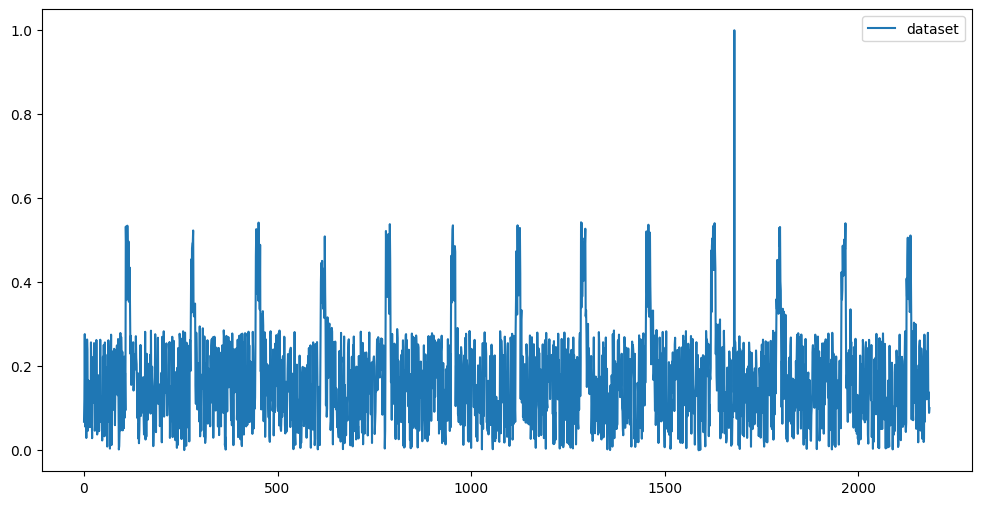

anomaly_iden [-16.9601587  -16.87027195 -16.77899764 -16.65937046 -16.57900494
 -16.51318096 -16.42138034 -16.39418757 -16.38522434 -16.37293784
 -16.29287174 -16.27293833 -16.23095208 -16.20223758 -16.19524832
 -16.17919799 -16.11914417 -16.10923924 -16.09682854 -16.07641814
 -16.05732347 -16.03138791 -16.01010814 -15.98724859 -15.97863882
 -15.9434215  -15.92757757 -15.90585456 -15.89481849 -15.89058013
 -15.84394346 -15.81926564 -15.78424049 -15.75416154 -15.68595371
 -15.6832175  -15.65366077 -15.63281524 -15.60753677 -15.5333782
 -15.51754532 -15.51212606 -15.46752575 -15.46461216 -15.39703772
 -15.3876899  -15.36058033 -15.34738408 -15.3418383  -15.31802403
 -15.31683808 -15.29935364 -15.27748208 -15.26181474 -15.23414082
 -15.22043495 -15.20135839 -15.19413264 -15.19394782 -15.18008571
 -15.16198275 -15.150773   -15.1147829  -15.09781837 -15.08834395
 -15.08514885 -15.06645146 -14.97341831 -14.97050825 -14.936708
 -14.92555841 -14.91316573 -14.9064325  -14.87029259 -14.83981766


In [21]:
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import SimpleRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from tensorflow.keras import losses
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects

period_size = 150
step_size = 50
median_q_threshold=0.5
lower_q_threshold=0.1
upper_q_threshold=0.9
anomaly_res =[40,-8]


class Swish(Layer):
    def __init__(self, beta, **kwargs):
        super(Swish, self).__init__(**kwargs)
        self.beta = K.cast_to_floatx(beta)
        print('beta',self.beta)

    def call(self, inputs):
        print('beta', self.beta,'input',inputs)
        return K.softsign(inputs) * self.beta

    def get_config(self):
        config = {'beta': float(self.beta)}
        base_config = super(Swish, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def compute_outp2ut_shape(self, input_shape):
        return input_shape


def intersection(lst1, lst2):
    lst3=[]
    for itr in range(len(lst1)):
        if lst1[itr][0] in lst2:
            lst3.append(lst1[itr])
    return lst3



def verify_stationarity(dataset):
    is_stationary=True
    test_results = adfuller(dataset)

    print(f"ADF test statistic: {test_results[0]}")
    print(f"p-value: {test_results[1]}")
    print("Critical thresholds:")

    for key, value in test_results[4].items():
        print(f"\t{key}: {value}")
    itr = 0
    for key, value in test_results[4].items():
       print('\t%s: %.3f' % (key, value))
       if itr==0:
         critical=value
       itr=itr+1

    print('critical',critical)
    if test_results[0] > critical:
         print('non stationary')
         is_stationary=False
    return  is_stationary

def create_dataset(dataset, look_back=1, tw=3):
    dataX, dataY = [], []  # dtaset for mean
    dataUpperX, dataUpperY = [], []  # dataset for std
    dataLowerX, dataLowerY = [], []  # dataset for mean and std for third deep learning
    multi = look_back // tw
    for i in range(len(dataset) - look_back - 1):
        q50X = []
        q90X =  []
        q10X = []
        a = dataset[i + 1:(i + look_back + 1)]
        indices = i + (multi - 1) * tw
        # print('last window', dataset[indices:(i + look_back), 0])
        c = numpy.quantile(a, median_q_threshold)
        u = numpy.quantile(a, upper_q_threshold)
        l = numpy.quantile(a, lower_q_threshold)
        for j in range(0, len(a), tw):
            q50 = numpy.quantile(a[j:j + tw], median_q_threshold)
            q90 = numpy.quantile(a[j:j + tw], upper_q_threshold)
            q10 = numpy.quantile(a[j:j + tw], lower_q_threshold)
            q50X.append(q50)
            q90X.append(q90)
            q10X.append(q10)
        dataX.append(q50X)
        dataY.append(c)
        dataUpperX.append(q90X)
        dataUpperY.append(u)
        dataLowerX.append(q10X)
        dataLowerY.append(l)

    return numpy.array(dataX), numpy.array(dataY), numpy.array(dataUpperX), numpy.array(dataUpperY), numpy.array(dataLowerX), numpy.array(dataLowerY)
def identify_anomaly_quantiles(prediction_errors):
    anomaly_detection=[]
    for m in range(0, len(prediction_errors), period_size):
        period_prediction_errors=prediction_errors[m:m + period_size]
        upper_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.9)
        lower_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.1)
        #upper_threshold=avg+2*std1
        #lower_threshold = avg - 2 * std1
        for i in range(len(period_prediction_errors)):
            if (period_prediction_errors[i]>0 and period_prediction_errors[i]> upper_threshold) or (period_prediction_errors[i]<0 and period_prediction_errors[i]< lower_threshold):
                anomaly_detection.append(period_prediction_errors[i])

    return anomaly_detection

def identify_anomaly(prediction_errors):
    anomaly_detection=[]
    for m in range(0, len(prediction_errors), period_size):
        period_prediction_errors=prediction_errors[m:m + period_size]
        avg = numpy.average(prediction_errors[m:m + period_size])
        std1 = numpy.std(prediction_errors[m:m + period_size])
        upper_threshold=avg+2*std1
        lower_threshold = avg - 2 * std1
        for i in range(len(period_prediction_errors)):
            if (period_prediction_errors[i]> upper_threshold) or ( period_prediction_errors[i]< lower_threshold):
                anomaly_detection.append(period_prediction_errors[i])


    return  anomaly_detection

def identify_alpha(dataset):
    alpha_detection=[]
    alpha=1
    prev_slope=1
    for m in range(0, len(dataset), period_size):
        period_dataset=dataset[m:m + period_size]
        slope=period_dataset[len(period_dataset)-1]-period_dataset[0]
        slope=slope/period_size
        alpha=slope/prev_slope
        alpha_detection.append(alpha)
        prev_slope=slope

    return  numpy.absolute(numpy.mean(alpha_detection))
if __name__ == '__main__':
    # fix random seed for reproducibility
    numpy.random.seed(7)
    # load the dataset
    dataframeneg = dataframeneg['value']
    dataset = dataframeneg.values
    dataset = dataset.reshape(-1,1)
    stationary=verify_stationarity(dataset)
    #dataframeneg=dataframeneg.diff(axis = 0, periods = 1)
    #dataset = dataframeneg.dropna().values
    dataset = dataset.astype('float32')
    # normalize the dataset
    print('dataset', dataset)
    #dataset=dataset.dropna()
    stationary = verify_stationarity(dataset)
    scaler = MinMaxScaler(feature_range=(0, 1))

    dataset = scaler.fit_transform(dataset)

    # split into train and test sets
    train_size = int(len(dataset) * 0.7)
    test_size = len(dataset) - train_size
    train, test = dataset[0:train_size, :], dataset[train_size:len(dataset), :]
    std=numpy.std(train)
    # reshape into X=t and Y=t+1
    look_back = period_size
    tw = step_size
    multi = look_back // tw
    trainX, trainY, trainXU, trainYU, trainXL, trainYL = create_dataset(train, look_back, tw)
    testX, testY , testXU, testYU, testXL, testYL= create_dataset(test, look_back, tw)
    print(trainX)

    #plt.show()
    alpha=identify_alpha(dataset)
    print('alpha',alpha)
    # reshape input to be [samples, time steps, features]
    trainX = numpy.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
    testX = numpy.reshape(testX, (testX.shape[0], testX.shape[1], 1))

    trainXU = numpy.reshape(trainXU, (trainXU.shape[0], trainXU.shape[1], 1))
    testXU = numpy.reshape(testXU, (testXU.shape[0], testXU.shape[1], 1))

    trainXL = numpy.reshape(trainXL, (trainXL.shape[0], trainXL.shape[1], 1))
    testXL = numpy.reshape(testXL, (testXL.shape[0], testXL.shape[1], 1))
    print(trainX)

    modelq50 = Sequential()
    modelq50.add(SimpleRNN(4, input_shape=(multi, 1)) )
    modelq50.add(Dense(1))
    modelq50.add(Swish(beta=1.5))
    modelq50.add(Activation(Swish(beta=1.5)))
    modelq50.compile(loss=losses.logcosh, optimizer='adam')
    modelq50.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

    modelq10 = Sequential()
    modelq10.add(SimpleRNN(4, input_shape=(multi, 1)))
    modelq10.add(Dense(1))
    modelq10.add(Swish(beta=1.5))
    modelq10.add(Activation(Swish(beta=1.5)))
    modelq10.compile(loss=losses.logcosh, optimizer='adam')
    modelq10.fit(trainXL, trainYL, epochs=50, batch_size=1, verbose=2)

    modelq90 = Sequential()
    modelq90.add(SimpleRNN(4, input_shape=(multi, 1)))
    modelq90.add(Dense(1))
    modelq90.add(Swish(beta=1.5))
    modelq90.add(Activation(Swish(beta=1.5)))
    modelq90.compile(loss=losses.logcosh, optimizer='adam')
    modelq90.fit(trainXU, trainYU, epochs=50, batch_size=1, verbose=2)
    # trainmeanPredict = modelmean.predict(numpy.array(trainX)
    # t).reshape(1,3,1)estmeanPredict = modelmean.predict(numpy.array(testX)
    # tr).reshape(1,3,1)ainstdPredict = modelstd.predict(numpy.array(trainX)
    # t).reshape(1,3,1)eststdPredict = modelstd.predict(numpy.array(testX)
    # pr).reshape(1,3,1)int('trainmeanPredict',trainmeanPredict)
    i = 0
    j = look_back
    actual_quantile_interval = []
    steps = tw
    positive = True
    anomalies=[]
    finalres_q10 = []
    finalres_q90 = []
    dataframeneg = dataframeneg2['value']
    dataset = dataframeneg.values
    dataset = dataset.reshape(-1,1)
    dataset = scaler.fit_transform(dataset)
    ts = dataset
    ts_accumulate=[]
    comparison_dataset=[]
    while j <= len(dataset)-2:
        q50_array = []
        q10_array = []
        q90_array = []


        temp = dataset[i:j]
        actual_quantile_interval.append(
            numpy.absolute(numpy.quantile(dataset[i + 1:j + 1], lower_q_threshold) - numpy.quantile(dataset[i + 1:j + 1], median_q_threshold)))
        print('print here', temp)

        for m in range(0, len(temp), steps):
            q50array = []
            q10array = []
            q90array = []
            q50 = numpy.quantile(temp[m:m + steps], median_q_threshold)
            q50array.append(q50)
            q50_array.append(q50array)

            q90 = numpy.quantile(temp[m:m + steps], upper_q_threshold)
            q90array.append(q90)
            q90_array.append(q90array)

            q10 = numpy.quantile(temp[m:m + steps], lower_q_threshold)
            q10array.append(q10)
            q10_array.append(q10array)

        # print('stdarray1', std_array)
        # std_array = numpy.array(std_array)
        # print('stdarray2', std_array)
        # std_array = numpy.reshape(std_array, (std_array.shape[0],std_array.shape[1], 1))
        # print('stdarray3', std_array)
        # print('avg_array',avg_array)
        # avg_array = numpy.array(avg_array)
        # avg_array = numpy.reshape(avg_array, (avg_array.shape[0],1, 1))
        final_q50_array = []
        final_q50_array.append(q50_array)
        print('final_q10_array', final_q50_array)
        final_q10_array = []
        final_q10_array.append(q10_array)

        final_q90_array = []
        final_q90_array.append(q90_array)
        q50_predict = modelq50.predict(numpy.array(final_q50_array).reshape(1,3,1))
        print('q50_predict', q50_predict)
        q10_predict = modelq10.predict(numpy.array(final_q10_array).reshape(1,3,1))
        q90_predict = modelq90.predict(numpy.array(final_q90_array).reshape(1,3,1))

        if j+1 < len(dataset) :
            iqr=q90_predict-q10_predict
            ucl=q50_predict+.95*iqr
            lcl=q50_predict-.95*iqr
            diff=q50_predict-dataset[j+1]
            if dataset[j+1]>ucl or dataset[j+1]<lcl:
                anomalies.append(dataset[j+1])
            #print('data',dataset[j+1],'diff',diff)

            #comparison_dataset.append(dataset[j+1])
            #dataset=numpy.delete(dataset,j+1)
            #print('length',len(dataset))
        #finalres_q10.append(q10_predict)
        #finalres_q90.append(q90_predict)

        j = j + 1
        i = i + 1

    # print('finalres',finalres)
    '''prediction_array_q10 = []
    prediction_array_q90 = []'''
    anomalies_array=[]

    for h in range(len(anomalies)):
        internal = anomalies[h]
        internal_array = []
        #internal_array.append(internal[0])
        anomalies_array.append(internal)
    anomalies_array = scaler.inverse_transform(anomalies_array)
    #comparison_dataset=scaler.inverse_transform(comparison_dataset)
    #print(anomalies_array)
    print('anomaly_iden', anomalies_array)
    print('anomaly_iden size', len(anomalies_array))
    '''for itr in range(len(anomalies_array)):
        print('data',comparison_dataset[itr],'diff',anomalies_array[itr])
    print('anomaly length',len(anomalies_array))'''
    '''ts_accumulate_another=[]
    for h in range(len(finalres_q10)):
        internal = finalres_q10[h]
        internal_q90 = finalres_q90[h]
        prediction_array_q10.append(internal[0])
        prediction_array_q90.append(internal_q90[0])
    for g in range(len(ts_accumulate)):
        internal=[]
        internal.append(ts_accumulate[g])
        #internal_q90 = finalres_q90[h]
        ts_accumulate_another.append(internal)
    finalres_q10 = scaler.inverse_transform(prediction_array_q10)
    finalres_q90 = scaler.inverse_transform(prediction_array_q90)
    #print('finalres', finalres_q10)'''
    '''trunc_finalres = []
    for g in range(len(finalres)):
        trunc_finalres.append(finalres[g])'''
    '''ts = ts[look_back:]
    ts = scaler.inverse_transform(ts)
    ts_accumulate=scaler.inverse_transform(ts_accumulate_another)
    print('lenght', len(ts_accumulate), 'actual_quantile_interval', len(finalres_q10))'''
    '''ts_array = []
    for g in range(len(ts)):
        ts_array.append(ts[g])'''
    '''finalres_q10_array=[]
    finalres_q90_array=[]
    for g in range(len(finalres_q10)-1):
        finalres_q10_array.append(finalres_q10[g])
        finalres_q90_array.append(finalres_q90[g])
    prediction_errors = []'''
   # for y in range(len(finalres_q10_array)):
    #    print('ts_accumulate',ts_accumulate[y], 'finalres_q10_array', finalres_q10_array[y], 'finalres_q90_array', finalres_q90_array[y])
        #prediction_errors.append(numpy.absolute(actual_quantile_interval[y] - trunc_finalres[y]))
    # testScore = math.sqrt(mean_squared_error(ts, trunc_finalres))
    # print('Test Score: %.2f RMSE' % (testScore))
    '''anomalies = identify_anomaly(anomalies_array)
    print('anomaly_iden', anomalies)
    print('anomaly_iden size', len(anomalies))
    print(intersection(anomalies, anomaly_res))'''
    plt.figure(figsize=(12, 6))
    #plt.plot(ts, label="passengers")
    plt.plot(dataset, label="dataset")
    #plt.plot(anomalies_array, label="difference")
    #plt.plot(newdata['ewa'], label="ewa")
    plt.legend(loc='best')

    plt.show()


    anomaly_res = [-8]
    anomalies = numpy.unique(anomalies_array)
    print('anomaly_iden', anomalies)
    print('anomaly_iden size', len(anomalies))
    print('ani', anomaly_res)

    anomalies_to_int = []

    for i in anomalies:
        anomalies_to_int.append(int(i))

    truep = (numpy.intersect1d(numpy.array(anomalies_to_int), numpy.array(anomaly_res)))
    print("TP2:")
    tp2 = len(truep)
    print(tp2)
    print("FP2:")
    fp2 = (len(anomalies) - len(truep))
    print(fp2)
    print("FN2:")
    fn2 = len(anomaly_res) - len(truep)
    print(fn2)
    print("TN:")
    print(1670-tp2-fp2-fn2)
    #1670 - datapoints in yahoo8
    precision = tp2/(tp2+fp2)
    recall = tp2/(tp2+fn2)
    print("Precision:")
    print(precision)
    print("Recall:")
    print(recall)

In [22]:
print("total recall:")
print((tp1+tp2)/(tp2+tp1+fn1+fn2))
print("total precision:")
print((tp1+tp2)/(tp2+tp1+fp1+fp2))


total recall:
1.0
total precision:
0.010416666666666666
